In [1]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
#Uncomment to create directory. Not needed if using the folder I shared.
# !mkdir /content/drive/MyDrive/UCC-AI-hackathon

In [2]:
%%capture
!pip install cloud-tpu-client https://storage.googleapis.com/tpu-pytorch/wheels/torch_xla-1.13-cp38-cp38m-linux_x86_64.whl
!pip install lightning albumentations matplotlib
#Uncomment if not done already. This clones to drive. Again, this has been done to the drive I shared. So not needed
# !git clone https://github.com/ReML-AI/ucc-ai-quest-baseline.git /content/drive/MyDrive/UCC-AI-hackathon

#Uncomment to clone to /content
# !git clone https://github.com/ReML-AI/ucc-ai-quest-baseline.git baseline



In [3]:
%%capture
!unzip -n /content/drive/MyDrive/UCC-AI-hackathon/data/warmup.zip   #change path accordingly to the path to the folder shared (on your drive)
# !unzip -n ./baseline/data/warmup.zip


In [ ]:
# %cd /content

In [4]:
%%capture
!pip install wandb -qU

In [5]:
import wandb
wandb.login(key = "your weight and bias key here")

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [7]:
import sys
sys.path.append('/content/drive/MyDrive/UCC-AI-hackathon') #change to path of the folder
# sys.path.append('./baseline')



In [8]:
import os
import torch
import json
import wandb
import random
import lightning.pytorch as pl
from tqdm import tqdm
from pathlib import Path
from PIL import Image
from albumentations.pytorch import ToTensorV2
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning import seed_everything
from datasets import SegDataModule, SegDataset
from models import SegModel
from utils import mask_to_rle, show_in_grid, mask_to_rgb
from metrics import SMAPIoUMetric

In [9]:
seed_everything(2023)

INFO: Seed set to 2023
INFO:lightning.fabric.utilities.seed:Seed set to 2023


2023

In [ ]:
# import numpy as np
# mask = np.array([1,2,3,4])
# mask_red = np.zeros_like(mask)
# mask_red[mask == 2]= 10
# mask_red

### Example of random images and corresponding masks from the dataset

Load some random images and corresponding masks

In [10]:
IMG_DIR = Path("./warmup/img/train/")
ANN_DIR = Path("./warmup/ann/train/")

imgs = [IMG_DIR / i for i in random.sample(os.listdir(IMG_DIR), 5)]
anns = [ANN_DIR / f"{Path(img).stem}.png" for img in imgs]

imgs = [Image.open(img) for img in imgs]
anns = [mask_to_rgb(Image.open(ann), {1: [55, 125, 34]}) for ann in anns] # convert label 1 to green (55, 125, 34)
imgs.extend(anns)

Display images in the first row and the corresponding masks in the second row

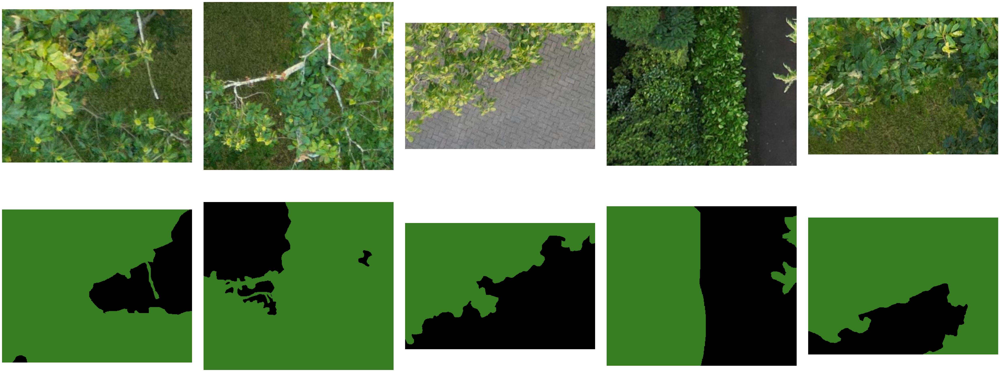

In [11]:
show_in_grid(imgs, num_rows=2, num_cols=int(len(imgs) / 2), show_plot=True)

In [12]:
#initialize parameters
epochs = 10
learning_rate = 1e-3
batch_size = 8

### Create datamodule object

In [13]:
datamodule = SegDataModule(root_dir=".", phase="warmup", batch_size=batch_size)

### Create a segmentation model object

In [14]:
#This has been updated in model.py
model = SegModel(learning_rate = learning_rate)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 85.4MB/s]


Weight and Biases

In [15]:
#Initialize
wandb.init(project="UCC-AI-hackathon",
           config={
            "epochs": epochs,
            "batch_size": batch_size,
            "lr": learning_rate,
            })

wandb: Currently logged in as: dara7 (oluwadara7). Use `wandb login --relogin` to force relogin


Setup Weights and Biases Logger

In [16]:
wandb_logger = pl.loggers.WandbLogger()

### Create a trainer object

In [17]:
checkpoint_callback = ModelCheckpoint(
        dirpath="checkpoints",
        monitor="val_high_vegetation_IoU",
        mode="max",
        filename="bestmodel",
        save_top_k=1,
    )

trainer = pl.Trainer(max_epochs=epochs, callbacks=[checkpoint_callback], log_every_n_steps=10, logger = wandb_logger)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


### Start training
The trainer will monitor `val_high_vegetation_IoU` metric and automatically save

In [18]:
trainer.fit(model, datamodule=datamodule)

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loggers/wandb.py:389: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name      | Type             | Params
-----------------------------------------------
0 | net       | FCN              | 32.9 M
1 | criterion | CrossEntropyLoss | 0     
-----------------------------------------------
32.9 M    Trainable params
0         Non-trainable params
32.9 M    Total params
131.789   Total estimated model params size (MB)
INFO:lightning.pytorch.callbacks.model_summary:
  | Name      | Type             | Params
-----------------------------------------------
0 | net       | FCN              | 32.9 M
1 | criterion | CrossEntropyLoss | 0     
-------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=1` in the `DataLoader` to improve performance.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=1` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


### Predict results from the best model checkpoint and generate submission file

Load model from checkpoint

In [19]:
loaded_model = SegModel.load_from_checkpoint("./checkpoints/bestmodel.ckpt")
loaded_model.eval();

We use the class SegDataset directly, instead of SegDataModule because we need access to the list of image file names

In [20]:
ds = SegDataset(root_dir=".", phase="warmup", split="valid", transform=ToTensorV2())
results = {}

We loop through each sample in the dataset, use the loaded model to make prediction. The prediction, which is a binary mask of `m x n` dimension, is converted to Run-length encoding format using the `mask_to_rle` function.

In [21]:
images = []
anns = []
preds = []

for i, batch in tqdm(enumerate(ds), total=len(ds), desc="Inferencing"):
  filename = ds.img_list[i]
  img, ann = batch
  out = model(img.float().unsqueeze(dim=0).to(model.device))['out']
  probs = torch.softmax(out, dim=1)
  pred = torch.argmax(probs, dim=1)
  pred = pred.detach().cpu().numpy().squeeze()

  images.append(img.cpu().numpy().transpose(1, 2, 0))
  anns.append(ann.cpu().numpy())
  preds.append(pred)

  rle = mask_to_rle(pred)

  results[filename] = {
      "counts": rle,
      "height": pred.shape[0],
      "width": pred.shape[1],
  }

Inferencing: 100%|██████████| 111/111 [07:13<00:00,  3.91s/it]


We dump the results object to the `results.json` file

In [22]:
with open ('results.json', 'w') as f:
  json.dump(results, f)

Finally, we zip the `results.json` file. You can submit the `results.zip` file to Codalab now, good luck!!

In [23]:
!zip results.zip results.json

  adding: results.json (deflated 63%)


### Visualize ground truth masks and predictions for comparison (Optional)

The ground truth masks are displayed on the second row. The predictions are displayed on the third row.

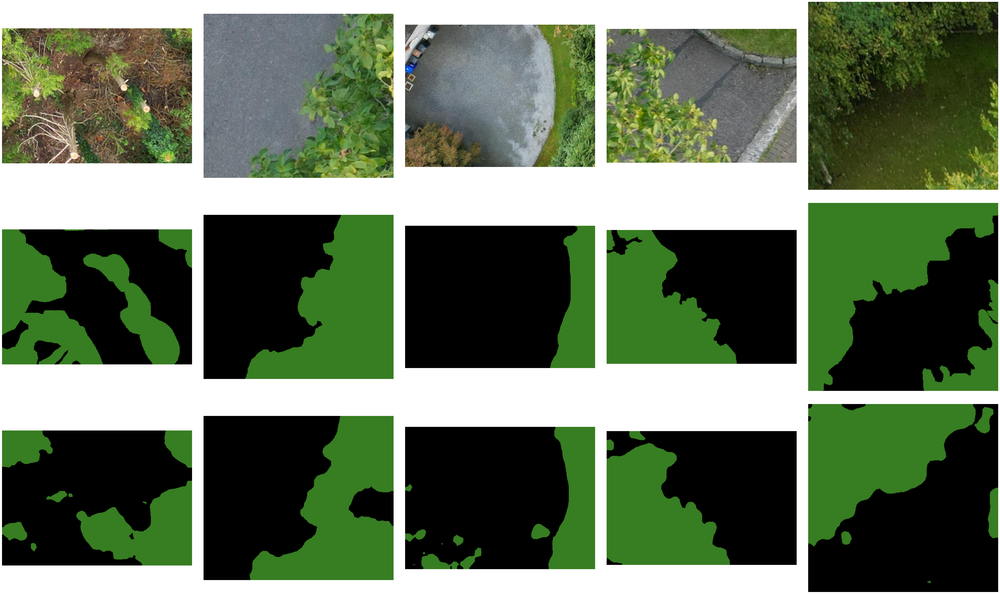

In [24]:
lst = []
indices = random.sample(range(len(images)), k=5)
lst.extend([images[i] for i in indices])
lst.extend([mask_to_rgb(anns[i], {1: [55, 125, 34]}) for i in indices])
lst.extend([mask_to_rgb(preds[i], {1: [55, 125, 34]}) for i in indices])

show_in_grid(lst, num_rows=3, num_cols=int(len(lst) / 3), show_plot=True)

### Calculate the performance of the model from the predictions

In [ ]:
metrics = SMAPIoUMetric()

for ann, pred in zip(anns, preds):
  metrics.process(input={"gt": ann, "pred": pred})

metrics.compute_metrics(metrics.results)

{'aAcc': 80.98,
 'mIoU': 67.93,
 'mAcc': 80.87,
 'background__IoU': 65.97,
 'background__Acc': 79.26,
 'high_vegetation__IoU': 69.88,
 'high_vegetation__Acc': 82.48}

In [ ]:
from torchvision import models

segmentation_models = [name for name in dir(models.segmentation) if not name.startswith('_')]

print(segmentation_models)


['DeepLabV3', 'DeepLabV3_MobileNet_V3_Large_Weights', 'DeepLabV3_ResNet101_Weights', 'DeepLabV3_ResNet50_Weights', 'FCN', 'FCN_ResNet101_Weights', 'FCN_ResNet50_Weights', 'LRASPP', 'LRASPP_MobileNet_V3_Large_Weights', 'deeplabv3', 'deeplabv3_mobilenet_v3_large', 'deeplabv3_resnet101', 'deeplabv3_resnet50', 'fcn', 'fcn_resnet101', 'fcn_resnet50', 'lraspp', 'lraspp_mobilenet_v3_large']
